### Importing Required Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud

### Reading data

In [140]:
ev = pd.read_csv("dataset.csv")
ev.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [141]:
# Getting the dimensions of the dataset
ev.shape

(112634, 17)

In [142]:
# To get some summary statistics
ev.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [143]:
# To get info about the data type of each column
ev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [144]:
# To get count of null values in the dataset
ev.isna().sum()

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64

In [145]:
# Since the null values are very less compared to available values we will drop them
ev.dropna(inplace =  True)

In [146]:
# Total number of duplicated rows
ev.duplicated().sum()

0

In [132]:
# What does the distribution of the 'Electric Range' look like?
fig = px.histogram(ev, x='Electric Range', nbins=10, title='Distribution of Electric Range',
                   color_discrete_sequence=['#C8A2C8'], opacity=0.8)
total_samples = ev.shape[0]
percentages = (ev['Electric Range'].value_counts(bins=10, sort=False) / total_samples) * 100
annot = [dict(x=x, y=y + 2, text=f"{p:.1f}%", showarrow=False, font=dict(size=12))
               for x, y, p in zip(percentages.index.mid, ev['Electric Range'].value_counts(bins=10, sort=False),
                                  percentages)]
fig.update_traces(marker_line_color='white', marker_line_width=0.5)
fig.update_layout(xaxis_title='Electric Range', yaxis_title='Frequency', title_font=dict(size=24),
                  xaxis_title_font=dict(size=16), yaxis_title_font=dict(size=16), title_pad=dict(t=20),
                  title_x=0.5, xaxis_title_standoff=12, yaxis_title_standoff=12, annotations=annot)
fig.show()

#### We can see a positively skewed distribution with max number of electric vehicles range between 0 - 50 (i.e. 50%) followed by 14.1% with range between 200 - 249

In [131]:
# Box Plot of 2020 Census Tract
fig = px.box(ev, y='2020 Census Tract', title='Box Plot of 2020 Census Tract')
fig.update_layout(yaxis_title ='2020 Census Tract', title_x = 0.5)
fig.show()

In [133]:
# Cross-tabulation of 'CAFV Eligibility' & 'Electric Vehicle Type'
cross_tab = pd.crosstab(ev['Electric Vehicle Type'], ev['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])
cross_tab

Clean Alternative Fuel Vehicle (CAFV) Eligibility,Clean Alternative Fuel Vehicle Eligible,Eligibility unknown as battery range has not been researched,Not eligible due to low battery range
Electric Vehicle Type,,,
Battery Electric Vehicle (BEV),46626,39097,9
Plug-in Hybrid Electric Vehicle (PHEV),11769,0,14651


In [134]:
# Making it more interactive
heatmap_data = cross_tab.values
x_labels = cross_tab.columns
y_labels = cross_tab.index

fig = px.imshow(heatmap_data, labels = dict(x = "CAFV Eligibility", y = "Electric Vehicle Type", color = "Freq"),
    x = x_labels,
    y = y_labels,
    color_continuous_scale = 'Magma')
fig.update_layout(title='Heatmap of Electric Vehicle Type vs. CAFV Eligibility', title_x = 0.5)
fig.show()

#### Max number of electric vehicles has BEV type with (CAFV) Eligibility

In [135]:
fig = px.scatter(ev, x='Electric Range', y='Base MSRP', hover_data=['Make', 'Model'])
fig.update_layout(title='Electric Range vs Base MSRP',
                  xaxis_title='Electric Range',
                  yaxis_title='Base MSRP', title_x = 0.5)
fig.show()

#### There doesn't seem to be any relationship between Electric Range & it's Base MSRP

In [155]:
count = ev['County'].value_counts()
max_ev = count.idxmax()

print(f"Maximum number of Electric Vehicles are available in {max_ev}")

Maximum number of Electric Vehicles are available in King


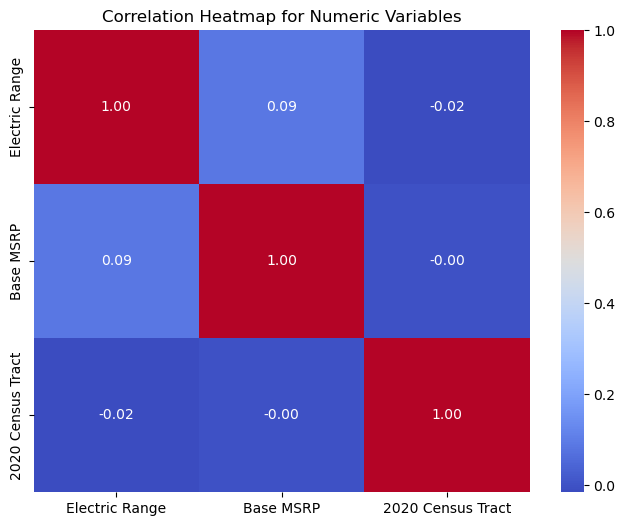

In [159]:
correlation_matrix = ev[numeric_columns].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Numeric Variables')
plt.show()

#### There doesn't seem to be any variable having strong correlation with another

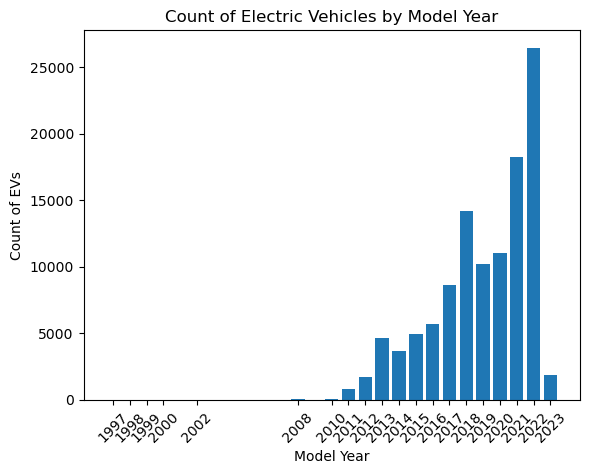

In [160]:
ev_count_by_year = ev.groupby('Model Year').size()

plt.bar(ev_count_by_year.index, ev_count_by_year.values)
plt.xlabel('Model Year')
plt.ylabel('Count of EVs')
plt.title('Count of Electric Vehicles by Model Year')
plt.xticks(ev_count_by_year.index, rotation=45)
plt.show()


(-0.5, 999.5, 499.5, -0.5)

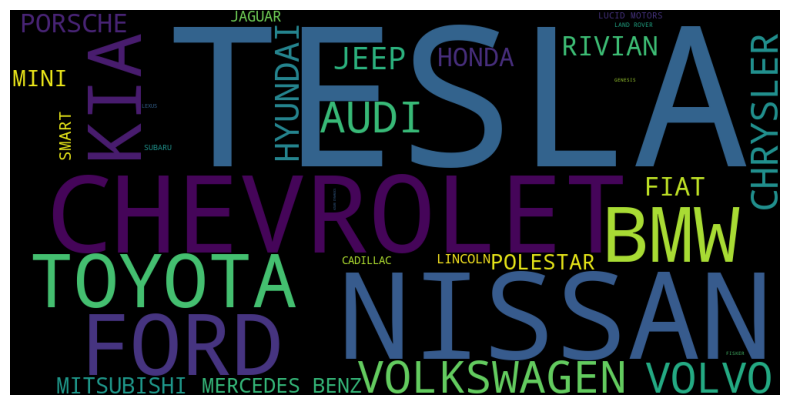

In [162]:
# Which electric vehicle is frequently occured?
total=' '.join(ev['Make'])
wordcloud=WordCloud(width=1000,height=500).generate(total)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

In [3]:
pip install bar-chart-race

  Using cached bar_chart_race-0.1.0-py3-none-any.whl (156 kB)
Note: you may need to restart the kernel to use updated packages.


In [14]:
import bar_chart_race as bcr

In [ ]:
bcr.bar_chart_race(
    # must be a DataFrame where each row represents a single period of time.
    df=final,


    # name of the output video file
    filename="final.mp4",


    # specify location of image folder
    #img_label_folder="bar_image_labels",


    # change the Figure properties
    fig_kwargs={
        'figsize': (26, 15),
        'dpi': 120,
        'facecolor': '#F8FAFF'
    },


    # orientation of the bar: h or v
    orientation="h",


    # sort the bar for each period
    sort="desc",


    # number of bars to display in each frame
    n_bars=10,


    # to fix the maximum value of the axis
    # fixed_max=True,


    # smoothness of the animation
    steps_per_period=45,


    # time period in ms for each row
    period_length=3000,


    # custom set of colors
    colors=[
        '#6ECBCE', '#FF2243', '#FFC33D', '#CE9673', '#FFA0FF', '#6501E5', '#F79522', '#699AF8', '#34718E', '#00DBCD',
        '#00A3FF', '#F8A737', '#56BD5B', '#D40CE5', '#6936F9', '#FF317B', '#0000F3', '#FFA0A0', '#31FF83', '#0556F3'
    ],
    # title and its styles
    title={'label': 'Year wise sales of each Makers from last decade',
           'size': 52,
           'weight': 'bold',
           'pad': 40
           },


    # adjust the position and style of the period label
    period_label={'x': .95, 'y': .15,
                  'ha': 'right',
                  'va': 'center',
                  'size': 72,
                  'weight': 'semibold'
                  },


    # style the bar label text
    bar_label_font={'size': 27},


    # style the labels in x and y axis
    tick_label_font={'size': 27},


    # adjust the style of bar
    # alpha is opacity of bar
    # ls - width of edge
    bar_kwargs={'alpha': .99, 'lw': 0},


    # adjust the bar label format
    bar_texttemplate='{x:.2f}',


    # adjust the period label format
    period_template='{x:.0f}',
)
